In [1]:
import re
import pandas as pd
from time import time
from collections import defaultdict
import json

import spacy as spacy

In [2]:
df = pd.read_csv("../../datasets/OPPBaseClassifierDataset.csv")
df.shape

(21395, 5)

In [3]:
df.head()

,Unnamed: 0,Clause,ClauseID,Category,JSON
0,0,The Information We Collect and Use Non-per...,1,First Party Collection/Use,"{""Collection Mode"": {""endIndexInSegment"": 128,..."
1,1,The Information We Collect and Use Non-per...,1,First Party Collection/Use,"{""Collection Mode"": {""endIndexInSegment"": 128,..."
2,2,The Information We Collect and Use Non-per...,1,First Party Collection/Use,"{""Collection Mode"": {""endIndexInSegment"": 128,..."
3,3,The Information We Collect and Use Non-per...,1,First Party Collection/Use,"{""Collection Mode"": {""endIndexInSegment"": 566,..."
4,4,The Information We Collect and Use Non-per...,1,First Party Collection/Use,"{""Collection Mode"": {""endIndexInSegment"": 566,..."


In [4]:
df.isnull().sum()

Unnamed: 0    0
Clause        0
ClauseID      0
Category      0
JSON          0
dtype: int64

In [5]:
df.shape

(21395, 5)

In [6]:
nlp = spacy.load('en_core_web_sm', disable=['ner', 'parser'])

def cleaning(doc):
    txt = [token.lemma_ for token in doc if not token.is_stop]
    if len(txt) > 2:
        return ' '.join(txt)

brief_cleaning = (re.sub("[^A-Za-z]+", ' ', str(row)).lower() for row in df['Clause'])
t = time()
txt = [cleaning(doc) for doc in nlp.pipe(brief_cleaning, batch_size=5000, n_threads=-1)]
print('Time taken to cleanup everything: {} mins'.format(round((time() - t)/60, 2)))

Time taken to cleanup everything: 3.02 mins


In [7]:
df_clean = pd.DataFrame({'clean': txt})
df_clean = df_clean.dropna().drop_duplicates()
df_clean.shape

(3647, 1)

In [8]:
df_clean.head()

,clean
0,information collect use non personally ident...
12,site collect information use cookie cookie sma...
18,personally identifiable information collect pe...
24,instance typically ask follow information e ma...
35,personally identifiable information provide si...


In [9]:
from gensim.models.phrases import Phrases, Phraser

In [10]:
sent = [row.split() for row in df_clean['clean']]

In [11]:
sent

[['information',
  'collect',
  'use',
  'non',
  'personally',
  'identifiable',
  'information',
  'collect',
  'use',
  'non',
  'personally',
  'identifiable',
  'information',
  'datum',
  'visit',
  'site',
  'standard',
  'operation',
  'internet',
  'server',
  'non',
  'personally',
  'identifiable',
  'information',
  'collect',
  'include',
  'user',
  'internet',
  'protocol',
  'ip',
  'address',
  'browser',
  'type',
  'domain',
  'name',
  'anonymous',
  'statistical',
  'datum',
  'use',
  'site',
  'example',
  'tell',
  'internet',
  'service',
  'provider',
  'visitor',
  'use',
  'name',
  'address',
  'information',
  'visitor',
  'allow',
  'identify',
  'particular',
  'visitor',
  'site'],
 ['site',
  'collect',
  'information',
  'use',
  'cookie',
  'cookie',
  'small',
  'text',
  'file',
  'website',
  'use',
  'recognize',
  'repeat',
  'user',
  'facilitate',
  'user',
  's',
  'ongoing',
  'access',
  'use',
  'website',
  'allow',
  'site',
  'track',
 

In [12]:
phrases = Phrases(sent, min_count=30, progress_per=1000)

In [13]:
phrases

In [14]:
bigram = Phraser(phrases)

In [15]:
sentences = bigram[sent]

In [16]:
sentences

In [17]:
word_freq = defaultdict(int)
for sent in sentences:
    for i in sent:
        word_freq[i] += 1
        print(sent)
len(word_freq)

['information', 'collect', 'use', 'non_personally', 'identifiable', 'information', 'collect', 'use', 'non_personally', 'identifiable', 'information', 'datum', 'visit', 'site', 'standard', 'operation', 'internet', 'server', 'non_personally', 'identifiable', 'information', 'collect', 'include', 'user', 'internet_protocol', 'ip_address', 'browser_type', 'domain', 'name', 'anonymous', 'statistical', 'datum', 'use', 'site', 'example', 'tell', 'internet', 'service_provider', 'visitor', 'use', 'name', 'address', 'information', 'visitor', 'allow', 'identify', 'particular', 'visitor', 'site']
['information', 'collect', 'use', 'non_personally', 'identifiable', 'information', 'collect', 'use', 'non_personally', 'identifiable', 'information', 'datum', 'visit', 'site', 'standard', 'operation', 'internet', 'server', 'non_personally', 'identifiable', 'information', 'collect', 'include', 'user', 'internet_protocol', 'ip_address', 'browser_type', 'domain', 'name', 'anonymous', 'statistical', 'datum', '

['international', 'english', 'language', 'privacy_policy', 'notmc', 's', 'official', 'statement', 'privacy', 'practice', 'case', 'inconsistency', 'english', 'language', 'privacy_policy', 'translation', 'language', 'english', 'language', 'document', 'precedence', 'translation']
['international', 'english', 'language', 'privacy_policy', 'notmc', 's', 'official', 'statement', 'privacy', 'practice', 'case', 'inconsistency', 'english', 'language', 'privacy_policy', 'translation', 'language', 'english', 'language', 'document', 'precedence', 'translation']
['international', 'english', 'language', 'privacy_policy', 'notmc', 's', 'official', 'statement', 'privacy', 'practice', 'case', 'inconsistency', 'english', 'language', 'privacy_policy', 'translation', 'language', 'english', 'language', 'document', 'precedence', 'translation']
['international', 'english', 'language', 'privacy_policy', 'notmc', 's', 'official', 'statement', 'privacy', 'practice', 'case', 'inconsistency', 'english', 'language

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['california', 'privacy', 'rights', 'california', 'civil', 'code', 'section', 'know', 'shine', 'light', 'law', 'permit', 'customer', 'california_resident', 'request', 'obtain', 'year', 'free', 'charge', 'information', 'personal', 'information', 'disclose', 'party', 'direct_marketing', 'purpose', 'precede', 'calendar', 'year', 'applicable', 'information', 'include', 'list', 'category', 'personal', 'information', 'share', 'name', 'address', 'party', 'share', 'information', 'immediately', 'precede', 'calendar', 'year', 'california_resident', 'like', 'request', 'submit', 'request', 'write', 'mark', 'faris', 'online', 'privacy', 'coordinator', 'gannett', 'law', 'department', 'jones', 'branch', 'drive', 'mclean', 'va']
['california', 'privacy', 'rights', 'california', 'civil', 'code', 'section', 'know', 'shine', 'light', 'law', 'permit', 'customer', 'california_resident', 'request', 'obtain', 'year', 'free', 'charge', 'information', 'personal', 'information', 'disclose', 'party', 'direct_mar

['example', 'e_mail', 'address', 'u', 'user', 'dictionary', 'com', 'hash', 'result', 'hash', 'value', 'der', 'ap', 'time', 'hash', 'function', 'apply', 'e_mail', 'address', 'result', 'call', 'way', 'hash', 'function', 'allow', 'convert', 'datum', 'way', 'possible', 'convert', 'e_mail', 'address', 'hash', 'value', 'possible', 'convert', 'value', 'e_mail', 'address']
['example', 'e_mail', 'address', 'u', 'user', 'dictionary', 'com', 'hash', 'result', 'hash', 'value', 'der', 'ap', 'time', 'hash', 'function', 'apply', 'e_mail', 'address', 'result', 'call', 'way', 'hash', 'function', 'allow', 'convert', 'datum', 'way', 'possible', 'convert', 'e_mail', 'address', 'hash', 'value', 'possible', 'convert', 'value', 'e_mail', 'address']
['example', 'e_mail', 'address', 'u', 'user', 'dictionary', 'com', 'hash', 'result', 'hash', 'value', 'der', 'ap', 'time', 'hash', 'function', 'apply', 'e_mail', 'address', 'result', 'call', 'way', 'hash', 'function', 'allow', 'convert', 'datum', 'way', 'possible'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['collect', 'information', 'use', 'bing', 'msn', 'services', 'microsoft', 'collect', 'kind', 'information', 'order', 'operate', 'effectively', 'provide', 'good', 'product_service', 'experience', 'collect', 'information', 'register', 'sign', 'use', 'site', 'service', 'information', 'company', 'collect', 'information', 'variety', 'way', 'include', 'web', 'form', 'technology', 'like', 'cookie', 'web', 'logging', 'software', 'computer', 'device']
['collect', 'information', 'use', 'bing', 'msn', 'services', 'microsoft', 'collect', 'kind', 'information', 'order', 'operate', 'effectively', 'provide', 'good', 'product_service', 'experience', 'collect', 'information', 'register', 'sign', 'use', 'site', 'service', 'information', 'company', 'collect', 'information', 'variety', 'way', 'include', 'web', 'form', 'technology', 'like', 'cookie', 'web', 'logging', 'software', 'computer', 'device']
['collect', 'information', 'use', 'bing', 'msn', 'services', 'microsoft', 'collect', 'kind', 'information'

['cookie', 'beacon', 'local', 'storage', 'similar_technology', 'use', 'cookie', 'web_beacon', 'html', 'local', 'storage', 'similar_technology', 'technology', 'allow', 'manage', 'access', 'use', 'sidearm', 'service', 'recognize', 'provide', 'personalization', 'help', 'understand', 'user', 'engage', 'sidearm', 'service', 'able', 'access', 'certain', 'area', 'web', 'site', 'computer', 'accept', 'cookie', 'respond', 'browser', 'base', 'track', 'signal']
['cookie', 'beacon', 'local', 'storage', 'similar_technology', 'use', 'cookie', 'web_beacon', 'html', 'local', 'storage', 'similar_technology', 'technology', 'allow', 'manage', 'access', 'use', 'sidearm', 'service', 'recognize', 'provide', 'personalization', 'help', 'understand', 'user', 'engage', 'sidearm', 'service', 'able', 'access', 'certain', 'area', 'web', 'site', 'computer', 'accept', 'cookie', 'respond', 'browser', 'base', 'track', 'signal']
['cookie', 'beacon', 'local', 'storage', 'similar_technology', 'use', 'cookie', 'web_beacon'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['information', 'primarily', 'collect', 'statistical', 'analysis', 'technical', 'improvement', 'site', 'national', 'archive', 'use', 'software', 'program', 'create', 'summary', 'statistic', 'purpose', 'assess', 'information', 'interest', 'determine', 'technical', 'design', 'specification', 'identify', 'system', 'performance', 'problem', 'area', 'certain', 'circumstance', 'additional', 'step', 'identify', 'base', 'information', 'share', 'information', 'include', 'identity', 'government', 'agency', 'information', 'collect', 'statistical', 'analysis', 'technical', 'improvement', 'maintain', 'indefinitely', 'question', 'comment', 'communication', 'receive', 'generally', 'retain', 'permanent', 'record', 'note', 'possible', 'mail', 'electronic', 'paper', 'federal', 'agency', 'receive', 'permanently', 'retain', 'agency', 'mail', 'group', 'record', 'determine', 'permanent', 'historical', 'value']
['information', 'primarily', 'collect', 'statistical', 'analysis', 'technical', 'improvement', 'si

['use', 'cookie', 'include', 'flash_cookie', 'web_beacon', 'party', 'advertiser', 'govern', 'privacy_policy', 'advertiser', 'jibjab', 'privacy_policy', 'jibjab', 'control', 'information', 'collect', 'party', 'advertiser', 'use', 'information', 'privacy_policy', 'datum', 'practice', 'party', 'advertiser', 'significantly', 'differ', 'jibjab', 'jibjab', 'make', 'representation', 'warranty', 'whatsoever', 'party', 'advertiser', 'data', 'policy', 'practice', 'information', 'datum', 'practice', 'party', 'advertiser', 'opt', 'use', 'information', 'visit']
['use', 'cookie', 'include', 'flash_cookie', 'web_beacon', 'party', 'advertiser', 'govern', 'privacy_policy', 'advertiser', 'jibjab', 'privacy_policy', 'jibjab', 'control', 'information', 'collect', 'party', 'advertiser', 'use', 'information', 'privacy_policy', 'datum', 'practice', 'party', 'advertiser', 'significantly', 'differ', 'jibjab', 'jibjab', 'make', 'representation', 'warranty', 'whatsoever', 'party', 'advertiser', 'data', 'policy',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [18]:
import multiprocessing
from gensim.models import Word2Vec

In [19]:
cores = multiprocessing.cpu_count()

# Parameters

- min_count = int - Ignores all words with total absolute frequency lower than this - (2, 100)
- window = int - The maximum distance between the current and predicted word within a sentence. E.g. window words on the left and window words on the left of our target - (2, 10)
- size = int - Dimensionality of the feature vectors. - (50, 300)
- sample = float - The threshold for configuring which higher-frequency words are randomly downsampled. Highly influencial. (0, 1e-5)
- alpha = float - The initial learning rate - (0.01, 0.05)
- min_alpha = float - Learning rate will linearly drop to min_alpha as training progresses. To set it: alpha - (min_alpha * epochs) ~ 0.00
- negative = int - If > 0, negative sampling will be used, the int for negative specifies how many "noise words" should be drown. If set to 0, no negative sampling is used. - (5, 20)
- workers = int - Use these many worker threads to train the model (=faster training with multicore machines)

In [20]:
w2v_model = Word2Vec(min_count=15,
                     window=2, 
                     size=300,
                     sample=6e-5,
                     alpha=0.03,
                     min_alpha=0.0007,
                     negative=20,
                     workers=cores-1)

t = time()
w2v_model.build_vocab(sentences, progress_per=1000)
print('Time to build model: {} mins'.format(round((time()-t)/60,2)))

Time to build model: 0.01 mins


In [21]:
t = time()
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=30, report_delay=1)
print('Time to train model: {} mins'.format(round((time()-t)/60,2)))

Time to train model: 0.17 mins


In [22]:
w2v_model.init_sims(replace=True)

# t-SNE Visualizations

In [23]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set_style("darkgrid")

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [24]:
def tsnescatterplot(model, word, list_names):
    arrays = np.empty((0, 300), dtype='f')
    word_labels = [word]
    color_list = ['red']
    
    arrays = np.append(arrays, model.wv.__getitem__([word]), axis=0)
    close_words = model.wv.most_similar([word])
    
    for wrd_score in close_words:
        wrd_vector = model.wv.__getitem__([wrd_score[0]])
        word_labels.append(wrd_score[0])
        color_list.append('blue')
        arrays = np.append(arrays, wrd_vector, axis=0)
        
    for wrd in list_names:
        wrd_vector = model.wv.__getitem__([wrd])
        word_labels.append(wrd)
        color_list.append('green')
        arrays = np.append(arrays, wrd_vector, axis=0)
        
    reduc = PCA(n_components=15).fit_transform(arrays)
    
    np.set_printoptions(suppress=True)
    
    Y = TSNE(n_components=2, random_state=0, perplexity=15).fit_transform(reduc)
    
    df = pd.DataFrame({'x': [x for x in Y[:, 0]],
                       'y': [y for y in Y[:, 1]],
                       'words': word_labels,
                       'color': color_list})
    
    fig, _ = plt.subplots()
    fig.set_size_inches(9, 9)
    
    p1 = sns.regplot(data=df,
                     x="x",
                     y="y",
                     fit_reg=False,
                     marker="o",
                     scatter_kws={'s': 40,
                                  'facecolors': df['color']
                                 }
                    )
    
    for line in range(0, df.shape[0]):
         p1.text(df["x"][line],
                 df['y'][line],
                 '  ' + df["words"][line].title(),
                 horizontalalignment='left',
                 verticalalignment='bottom', size='medium',
                 color=df['color'][line],
                 weight='normal'
                ).set_size(15)
            
    plt.xlim(Y[:, 0].min()-15, Y[:, 0].max()+15)
    plt.ylim(Y[:, 1].min()-15, Y[:, 1].max()+15)
            
    plt.title('t-SNE visualization for {}'.format(word.title()))

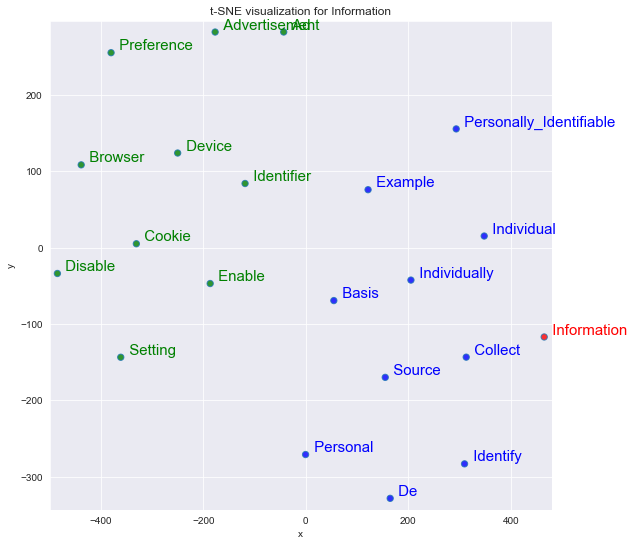

In [25]:
tsnescatterplot(w2v_model, 'information', [i[0] for i in w2v_model.wv.most_similar(negative=["jurisdiction"])])

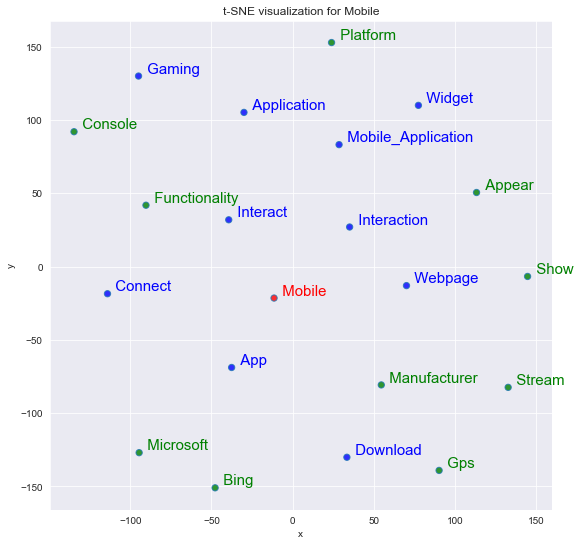

In [31]:
tsnescatterplot(w2v_model, "mobile", [t[0] for t in w2v_model.wv.most_similar(positive=["mobile"], topn=20)][10:])

In [33]:
w2v_model.wv.save_word2vec_format('../../models/w2v_base_model.bin', binary=True)